In [1]:
import torch
torch.set_grad_enabled(False)
import sys
import time
import random
import csv
import numpy as np

import scipy.io
from scipy.io import loadmat

import pickle

from tqdm import tqdm
from tqdm import notebook

import matplotlib
import matplotlib.pyplot as plt

import importlib
import utils

import copy
# Enable autoreload
%load_ext autoreload
%autoreload 2
importlib.reload(utils)

# Set seeds for reproducibility
random.seed(0)
np.random.seed(0)
torch.manual_seed(0)
if torch.cuda.is_available():
    torch.cuda.manual_seed(0)
    torch.cuda.manual_seed_all(0)  # if you are using multi-GPU.
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark     = False

TORCH_DTYPE = torch.float64 #NB: Basically all of the matrices in Spatial_GP have 1.e-7 added to the diagonal, to be changed if we want to use float64
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# device = torch.device("cpu")
torch.set_default_dtype(TORCH_DTYPE)
torch.set_default_device(device)
print(f'Device is: {device}')




Using device: cuda:0 (from utils.py)
Using device: cuda:0 (from utils.py)
Device is: cuda:0


### How this works:

We choose initial training points to be considered a random set of images to present to the retina. On this set, the complete GP will be run , to find STA paramaters eps_0: center, beta: width , rho: smoothness

We run the algorithm saving the seed used for picking the training images, so that this set can be changed and different runs with different initial conditions can be averaged.

1. Import the dataset and create a total training set X,R
2. Pick the cell and the initial training points, extracted randomly. These correspond also to the number of inducing points
3. Save the seed so you can keep the initial training set, and the fitted model
3. 


### Parameters of the training

In [2]:
rand_xtilde = True # If True, xtilde (inducing points) are chosen randomly, if False, xtilde is chosen from the first ntilde images

cellid       = 8         # Choose cell
ntrain_start = 50        # Number of first training data points

kernfun      = 'acosker' # Choose kernel function

nEstep       = 10         # Total number of E-steps iterations.
nFparamstep  = 10  
nMstep       = 10         # Total number of M-steps iterations. 
maxiter      = 10         # Iterations of the optimization algorithm comprising M and E steps

ntilde       = ntrain_start

### Import dataset and generate starting dataset

Create starting dataset on which to train with m step with ntilde = ntrain_start

In [3]:
# Open the .pkl dataset file for reading in binary mode (rb)
with open('/home/idv-eqs8-pza/IDV_code/Variational_GP/spatial_GP/Data/data2_41mixed_tr28.pkl', 'rb') as file:
    # Load the data from the file
    loaded_data = pickle.load(file)
    # loaded_data is a Dataset object from module Data with attributes "images_train, _val, _test" as well as responses

X_train = torch.tensor(loaded_data.images_train).to(device, dtype=TORCH_DTYPE) #shape (2910,108,108,1) where 108 is the number of pixels. 2910 is the amount of training points
X_val   = torch.tensor(loaded_data.images_val).to(device, dtype=TORCH_DTYPE)
X_test  = torch.tensor(loaded_data.images_test).to(device, dtype=TORCH_DTYPE) # shape (30,108,108,1) # nimages, npx, npx

R_train = torch.tensor(loaded_data.responses_train).to(device, dtype=TORCH_DTYPE) #shape (2910,41) 2910 is the amount of training data, 41 is the number of cells
R_val   = torch.tensor(loaded_data.responses_val).to(device, dtype=TORCH_DTYPE)
R_test  = torch.tensor(loaded_data.responses_test).to(device, dtype=TORCH_DTYPE) # shape (30,30,42) 30 repetitions, 30 images, 42 cells

# Create the complete dataset
X = torch.cat( (X_train, X_val), axis=0,) #shape (3160,108,108,1)
R = torch.cat( (R_train, R_val), axis=0,)

n_px_side = X.shape[1]  

# Reshape images to 1D vector and choose a cell
X = torch.reshape(X, ( X.shape[0], X.shape[1]*X.shape[2])) 
R = R[:,cellid] # shape (nt,) where nt is the number of trials

# Choose a random subset of the data and save the idx
all_idx  = torch.arange(0, X.shape[0])                     # Indices of the whole dataset  
torch.manual_seed(8)
torch.cuda.manual_seed(8)
all_idx_perm  = torch.randperm(all_idx.shape[0])                         # Random permutation of the indices

test_1000_idx = all_idx_perm[-1000:]                                     # These will be the indices of the test set
all_idx_perm  = all_idx_perm[~torch.isin( all_idx_perm, test_1000_idx )] # Remove the test set indices from the permutation
rndm_idx      = all_idx_perm[:ntrain_start]                              # These will be the indices of the initial training. This way ensures not repetitions.


start_idx     = rndm_idx
# start_idx     = rndm_idx.sort()[0]
in_use_idx    = start_idx
xtilde_idx    = in_use_idx
remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )]
# remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )].sort()[0]

# Set the starting set
xtilde_start  = X[xtilde_idx,:]                           # In the simplest case the starting points are all inducing points
X_in_use      = X[in_use_idx,:]
X_remaining   = X[remaining_idx,:]
X_test_1000   = X[test_1000_idx,:]

R_remaining   = R[remaining_idx]
R_in_use      = R[in_use_idx]
R_test_1000   = R[test_1000_idx]

# Estimate memory usage
# Calculate memory usage for each tensor
X_memory = X.element_size() * X.nelement()
r_memory = R.element_size() * R.nelement()
# Total memory usage in bytes
total_memory_bytes = X_memory + r_memory
# Convert bytes to megabytes (MB)
total_memory_MB = total_memory_bytes / (1024 ** 2)
print(f'Total dataset memory on GPU: {total_memory_MB:.2f} MB')


Total dataset memory on GPU: 281.23 MB


### Select cell, starting hyperparameters and firing rate parameters

In [4]:
torch.set_grad_enabled(False)
# For details on the hyperparameters choice see one_cell_fit.ipynb
logbetaexpr = utils.fromlogbetasam_to_logbetaexpr( logbetasam=torch.tensor(5.5) )# Logbetaexpr in this code is equal to logbeta in Samuele's code. Samuele's code set logbeta to 5.5
logrhoexpr  = utils.fromlogrhosam_to_logrhoexpr( logrhosam=torch.tensor(5)) 
# logbetaexpr = torch.tensor(4.65)
# logrhoexpr = torch.tensor(4.3)
sigma_0    = torch.tensor(1.0)
Amp        = torch.tensor(1.0) 
eps_0x     = torch.tensor(0.0001)
eps_0y     = torch.tensor(0.0001)
# Hypermarameters, if needed to be set manually
theta = {'sigma_0': sigma_0, 'Amp': Amp, 'eps_0x':eps_0x, 'eps_0y':eps_0y, '-2log2beta': logbetaexpr, '-log2rho2': logrhoexpr,  }

# Set the gradient of the hyperparemters to be updatable 
for key, value in theta.items(): # to exclude a single hyperparemeters from the optimization ( to exclude them all just set nmstep=0 and dont do the M-step)
    # if key == 'Amp':
        # continue
    theta[key] = value.requires_grad_()

# If hyperparameters are set manually:
# theta = prev_theta
hyperparams_tuple = utils.generate_theta( x=X_in_use, r=R_in_use, n_px_side=n_px_side, display=True, **theta)
# If hyperparameters are set based on the STAs:
# hyperparams_tuple = utils.generate_theta( x=X, r=r, n_px_side=n_px_side, display=True)

A        = torch.tensor(0.01)
logA     = torch.log(A)
# lambda0  = torch.tensor(0.31)
lambda0  = torch.tensor(1.)
f_params = {'logA': logA, 'lambda0':lambda0}
f_params['logA'] = f_params['logA'].requires_grad_() # The optimal lambda0 is given with a fixed A.

fit_parameters = {'ntilde':      ntilde,
                  'maxiter':     maxiter,
                  'nMstep':      nMstep,
                  'nEstep':      nEstep,
                  'nFparamstep': nFparamstep,
                  'kernfun':     kernfun,
                  'cellid':      cellid,
                  'n_px_side':   n_px_side,
                  'in_use_idx':  in_use_idx,     # Used idx for generating xtilde, referred to the whole X dataset
                  'xtilde_idx':  xtilde_idx,     # Used idx for generating the complete set, referred to the whole X dataset
                  'start_idx':   start_idx }     # Indexes used to generate the initial training set, same as the starting xtilde

init_model = {
        'fit_parameters':    fit_parameters,
        'xtilde':            xtilde_start,
        'hyperparams_tuple': hyperparams_tuple,     # Contains also the upper and lower bounds for the hyperparameters
        'f_params':          f_params,
        # 'm':                 torch.zeros( (ntilde) )
        # 'm': torch.ones( (ntilde) )
        #'V': dont initialize V if you want it to be initialized as K_tilde and projected _exactly_ as K_tilde_b for stabilisation
    }

updated sigma_0 to 1.0000
updated Amp to 1.0000
updated eps_0x to 0.0001
updated eps_0y to 0.0001
updated -2log2beta to 4.8069
updated -log2rho2 to 4.3069


### Fit the starting model
And save it needed to start a new active fit

Initial Loss: 128.4550
Loss iter 1: 53.8982
Loss iter 2: 52.4540
Loss iter 3: 52.0129
Loss iter 4: 52.3094
Loss iter 5: 52.1888
Loss iter 6: 52.1174
Loss iter 7: 52.0710
Loss iter 8: 52.0340
Loss iter 9: 51.9940

Time spent for E-steps:       0.600s,
Time spent for f params:      0.399s
Time spent for m update:      0.201s
Time spent for M-steps:       0.590s
Time spent for All-steps:     1.190s
Time spent computing Kernels: 0.018s
Time spent computing Loss:    0.003s

Time total after init:        1.217s
Time total before init:       1.274s
Final Loss: 51.9940


 Pietro's model: R2 = 0.27 ± 0.01 Cell: 8 maxiter = 10, nEstep = 10, nMstep = 10 



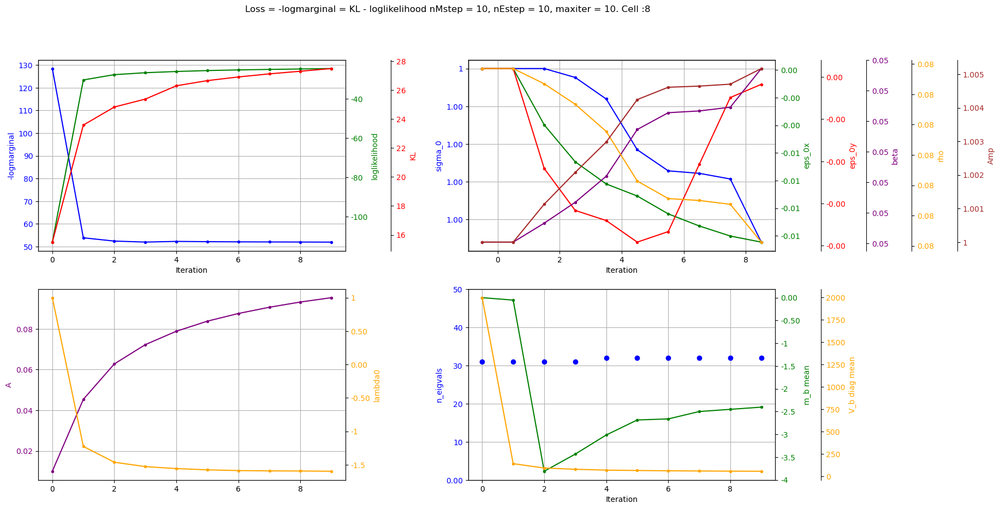

In [5]:
torch.set_grad_enabled(False)
fit_model, err_dict = utils.varGP(X_in_use, R_in_use, **init_model)

# Save the model. All of the matrices are projected in the eigenspace of big eigenvalues of K_tilde. Indicated by _b
start_model = fit_model

if err_dict['is_error']:
    print('Error in the fit')
    raise err_dict['error']

# Save the model
# utils.save_model(start_model, f'models/starting_models_active_learning/cell:{cellid}_nstart:{ntrain_start}', additional_description='Starting model for active learning')

spk_count_test, spk_count_pred, r2, sigma_r2 = utils.test(X_test, R_test, X_train=X, at_iteration=None, **fit_model )
# spk_count_test, spk_count_pred, r2, sigma_r2 = utils.test(X_test, R_test, X_train=X, at_iteration=None, **start_model )

utils.plot_loss_and_theta_notebook(fit_model, figsize=(15,10), marker='.')#ylim_logmarg=(0, 5000))


### Save or load model

In [6]:
# Save the model
# utils.save_model(fit_model, f'models/bugs/cell:{cellid}', additional_description='Model started with 50 ntilde=ntrain, randomly picked images until nan in r2. Saved last model (after fit ). It gives Nan')
# start_model = utils.load_model(f'models/starting_models_active_learning/cell:8_nstart:20')

### Evaluate the utility of each remaining image
New version

In [7]:
in_use_idx    = start_model['fit_parameters']['in_use_idx']
xtilde_idx    = start_model['fit_parameters']['xtilde_idx']

remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )]

X_remaining = X[remaining_idx]
R_remaining = R[remaining_idx]

xtilde      = X[xtilde_idx]  # This has to be the same as start_model['xtilde']

xstar = X_remaining

kernfun       = start_model['fit_parameters']['kernfun']
mask          = start_model['mask']
C             = start_model['C']
B             = start_model['B']
K_tilde_b     = start_model['K_tilde_b']
K_tilde_inv_b = start_model['K_tilde_inv_b']
K_b           = start_model['K_b']
Kvec          = start_model['Kvec']
m_b           = start_model['m_b']
V_b           = start_model['V_b']    
f_params_fit  = start_model['f_params']
A             = torch.exp(f_params_fit['logA'])
lambda0       = torch.exp(f_params_fit['loglambda0']) if 'loglambda0' in f_params_fit else f_params_fit['lambda0']

start_time = time.time()

# Calculate the matrices to compute the lambda moments. They are referred to the unseen images xstar
Kvec = utils.acosker(theta, xstar[:,mask], x2=None, C=C, dC=None, diag=True)
K    = utils.acosker(theta, xstar[:,mask], x2=xtilde_start[:,mask], C=C, dC=None, diag=False)
K_b  = K @ B 

lambda_m_t, lambda_var_t = utils.lambda_moments( xstar[:,mask], K_tilde_b, K_b@K_tilde_inv_b, Kvec, K_b, C, m_b, V_b, theta, kernfun)  

logf_mean = A*lambda_m_t + lambda0
logf_var  = A**2 * lambda_var_t

# Estimate the utility and cap the maximum r ( used in a summation to infinity )
r_masked = torch.arange(0, 100, dtype=TORCH_DTYPE)
u2d = utils.nd_utility(logf_var, logf_mean, r_masked )
print(f'\nElapsed time for lambda moments and utility : {time.time()-start_time:.2f} seconds')  



Elapsed time for lambda moments and utility : 0.02 seconds


### Find the index(es) for the most useful image 
Check the correspondence between the index: ```i_best``` of the ```xstar = X_remaining``` images with the one: ```x_idx_best```  for the complete dataset ```X```

In [8]:
i_best     = u2d.argmax()           # Index of the best image in the utility vector
x_idx_best = remaining_idx[i_best]  # Index of the best image in the dataset indices
print(f'Utility: {u2d[i_best].item():<8.4f} |  Best image ID: {i_best}  | Best image index: {x_idx_best}')


# Using the indexes of the utility
Kvec = utils.acosker(theta, xstar[:,mask], x2=None, C=C, dC=None, diag=True)
K    = utils.acosker(theta, xstar[:,mask], x2=xtilde_start[:,mask], C=C, dC=None, diag=False)
K_b  = K @ B 

lambda_m_t, lambda_var_t = utils.lambda_moments( xstar[:,mask], K_tilde_b, K_b@K_tilde_inv_b, Kvec, K_b, C, m_b, V_b, theta, kernfun)  
logf_mean = A*lambda_m_t + lambda0
logf_var  = A**2 * lambda_var_t
print(f' this has utility {utils.nd_utility(logf_var[i_best], logf_mean[i_best], r_masked)} and f_mean :{torch.exp(logf_mean[i_best]).item():8.4f}')


# Using the indixes of the dataset X
# Calculate the matrices to compute the lambda moments. They are referred to the unseen images xstar
Kvec = utils.acosker(theta, X[x_idx_best,mask][None,:], x2=None, C=C, dC=None, diag=True)
K    = utils.acosker(theta, X[x_idx_best,mask][None,:], x2=xtilde_start[:,mask], C=C, dC=None, diag=False)
K_b  = K @ B 
lambda_m_t, lambda_var_t = utils.lambda_moments( X[x_idx_best,mask][None,:], K_tilde_b, K_b@K_tilde_inv_b, Kvec, K_b, C, m_b, V_b, theta, kernfun)  
logf_mean = A*lambda_m_t + lambda0
logf_var  = A**2 * lambda_var_t
print(f' this has utility {utils.nd_utility(logf_var, logf_mean, r_masked)} and f_mean :{torch.exp(logf_mean).item():8.4f}')

Utility: 0.0746   |  Best image ID: 1875  | Best image index: 3072
 this has utility tensor([0.0746], device='cuda:0') and f_mean :  0.9790
 this has utility tensor([0.0746], device='cuda:0') and f_mean :  0.9790


### Active learning loop
Update the indexes tensors and fit the new model in a loop 

After fitting the model with the dataset incremented by one image, reevaluate the utility, find the best mage index and loop.


### Active training loop

In [11]:
torch.set_grad_enabled(False)

loglk_test_1000_dict = {}

for p in range(10):

    print(f'=========== Active loop : Initial condition number {p} ====================')

    #region

    rand_xtilde = True # If True, xtilde (inducing points) are chosen randomly, if False, xtilde is chosen from the first ntilde images

    cellid       = 8         # Choose cell
    ntrain_start = 50        # Number of first training data points

    kernfun      = 'acosker' # Choose kernel function

    nEstep       = 10         # Total number of E-steps iterations.
    nFparamstep  = 10  
    nMstep       = 10         # Total number of M-steps iterations. 
    maxiter      = 10         # Iterations of the optimization algorithm comprising M and E steps

    ntilde       = ntrain_start

    # Choose a random subset of the data and save the idx
    all_idx  = torch.arange(0, X.shape[0])                     # Indices of the whole dataset  
    torch.manual_seed(p)
    torch.cuda.manual_seed(p)
    all_idx_perm  = torch.randperm(all_idx.shape[0])                         # Random permutation of the indices

    test_1000_idx = all_idx_perm[-1000:]                                     # These will be the indices of the test set
    all_idx_perm  = all_idx_perm[~torch.isin( all_idx_perm, test_1000_idx )] # Remove the test set indices from the permutation
    rndm_idx      = all_idx_perm[:ntrain_start]                              # These will be the indices of the initial training. This way ensures not repetitions.


    start_idx     = rndm_idx
    # start_idx     = rndm_idx.sort()[0]
    in_use_idx    = start_idx
    xtilde_idx    = in_use_idx
    remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )]
    # remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )].sort()[0]

    # Set the starting set
    xtilde_start  = X[xtilde_idx,:]                           # In the simplest case the starting points are all inducing points
    X_in_use      = X[in_use_idx,:]
    X_remaining   = X[remaining_idx,:]
    X_test_1000   = X[test_1000_idx,:]

    R_remaining   = R[remaining_idx]
    R_in_use      = R[in_use_idx]
    R_test_1000   = R[test_1000_idx]

    # Estimate memory usage
    # Calculate memory usage for each tensor
    X_memory = X.element_size() * X.nelement()
    r_memory = R.element_size() * R.nelement()
    # Total memory usage in bytes
    total_memory_bytes = X_memory + r_memory
    # Convert bytes to megabytes (MB)
    total_memory_MB = total_memory_bytes / (1024 ** 2)
    print(f'Total dataset memory on GPU: {total_memory_MB:.2f} MB')


    torch.set_grad_enabled(False)
    # For details on the hyperparameters choice see one_cell_fit.ipynb
    logbetaexpr = utils.fromlogbetasam_to_logbetaexpr( logbetasam=torch.tensor(5.5) )# Logbetaexpr in this code is equal to logbeta in Samuele's code. Samuele's code set logbeta to 5.5
    logrhoexpr  = utils.fromlogrhosam_to_logrhoexpr( logrhosam=torch.tensor(5)) 
    # logbetaexpr = torch.tensor(4.65)
    # logrhoexpr = torch.tensor(4.3)
    sigma_0    = torch.tensor(1.0)
    Amp        = torch.tensor(1.0) 
    eps_0x     = torch.tensor(0.0001)
    eps_0y     = torch.tensor(0.0001)
    # Hypermarameters, if needed to be set manually
    theta = {'sigma_0': sigma_0, 'Amp': Amp, 'eps_0x':eps_0x, 'eps_0y':eps_0y, '-2log2beta': logbetaexpr, '-log2rho2': logrhoexpr,  }

    # Set the gradient of the hyperparemters to be updatable 
    for key, value in theta.items(): # to exclude a single hyperparemeters from the optimization ( to exclude them all just set nmstep=0 and dont do the M-step)
        # if key == 'Amp':
            # continue
        theta[key] = value.requires_grad_()

    # If hyperparameters are set manually:
    # theta = prev_theta
    hyperparams_tuple = utils.generate_theta( x=X_in_use, r=R_in_use, n_px_side=n_px_side, display=True, **theta)
    # If hyperparameters are set based on the STAs:
    # hyperparams_tuple = utils.generate_theta( x=X, r=r, n_px_side=n_px_side, display=True)

    A        = torch.tensor(0.01)
    logA     = torch.log(A)
    # lambda0  = torch.tensor(0.31)
    lambda0  = torch.tensor(1.)
    f_params = {'logA': logA, 'lambda0':lambda0}
    f_params['logA'] = f_params['logA'].requires_grad_() # The optimal lambda0 is given with a fixed A.

    fit_parameters = {'ntilde':      ntilde,
                    'maxiter':     maxiter,
                    'nMstep':      nMstep,
                    'nEstep':      nEstep,
                    'nFparamstep': nFparamstep,
                    'kernfun':     kernfun,
                    'cellid':      cellid,
                    'n_px_side':   n_px_side,
                    'in_use_idx':  in_use_idx,     # Used idx for generating xtilde, referred to the whole X dataset
                    'xtilde_idx':  xtilde_idx,     # Used idx for generating the complete set, referred to the whole X dataset
                    'start_idx':   start_idx }     # Indexes used to generate the initial training set, same as the starting xtilde

    init_model = {
            'fit_parameters':    fit_parameters,
            'xtilde':            xtilde_start,
            'hyperparams_tuple': hyperparams_tuple,     # Contains also the upper and lower bounds for the hyperparameters
            'f_params':          f_params,
            # 'm':                 torch.zeros( (ntilde) )
            # 'm': torch.ones( (ntilde) )
            #'V': dont initialize V if you want it to be initialized as K_tilde and projected _exactly_ as K_tilde_b for stabilisation
        }
    
    fit_model, err_dict = utils.varGP(X_in_use, R_in_use, **init_model)

    # Save the model. All of the matrices are projected in the eigenspace of big eigenvalues of K_tilde. Indicated by _b
    start_model = fit_model

    if err_dict['is_error']:
        print('Error in the fit')
        raise err_dict['error']

    #endregion

    active_model = copy.deepcopy(start_model)
    # active_model = copy.deepcopy(start_model)
    # fit_model = copy.deepcopy(prev_model)

    r2_vec = []

    loss_vec = []

    loglk_test_1000 = [None]*250

    for j in range(250):
        print(f'=========== Active Loop number: {p}, New image number {j} ====================')

        # region __________ Retreive the values from the last model fit __________
        in_use_idx    = active_model['fit_parameters']['in_use_idx']
        xtilde_idx    = active_model['fit_parameters']['xtilde_idx']

        remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )]

        X_remaining = X[remaining_idx]
        R_remaining = R[remaining_idx]

        xtilde = X[xtilde_idx]  # This has to be the same as start_model['xtilde']

        xstar  = X_remaining

        kernfun       = active_model['fit_parameters']['kernfun']
        if kernfun == 'acosker': kernfun = utils.acosker
        n_px_side     = active_model['fit_parameters']['n_px_side']
        EIGVAL_TOL    = active_model['fit_parameters']['eigval_tol']

        final_kernel  = active_model['final_kernel']
        
        mask          = active_model['mask']
        C             = active_model['C']
        B             = active_model['B']
        K_tilde_b     = active_model['K_tilde_b']
        K_tilde_inv_b = active_model['K_tilde_inv_b']
        K_b           = active_model['K_b']
        Kvec          = active_model['Kvec']
        m_b           = active_model['m_b']
        V_b           = active_model['V_b']    
        f_params      = active_model['f_params']
        theta         = active_model['hyperparams_tuple'][0]
        A             = torch.exp(f_params['logA'])
        lambda0       = torch.exp(f_params['loglambda0']) if 'loglambda0' in f_params else f_params['lambda0']
        
        theta_lower_lims  = active_model['hyperparams_tuple'][1]
        theta_higher_lims = active_model['hyperparams_tuple'][2]

        # endregion

        # region __________ Calculate the loglikelihood on the 1000 Test set __________
        Kvec_test = kernfun(theta, X_test_1000[:,mask], x2=None, C=C, dC=None, diag=True)
        K_test    = kernfun(theta, X_test_1000[:,mask], x2=xtilde[:,mask], C=C, dC=None, diag=False)
        K_test_b  = K_test @ B 

        lambda_m_t, lambda_var_t = utils.lambda_moments( X_test_1000[:,mask], K_tilde_b, K_test_b@K_tilde_inv_b, Kvec_test, K_test_b, C, m_b, V_b, theta)

        f_mean = utils.mean_f_given_lambda_moments( f_params, lambda_m_t, lambda_var_t)

        loglk_test_1000.append( utils.compute_loglikelihood( R_test_1000,  f_mean, lambda_m_t, lambda_var_t, f_params )[0] )               

        # region __________ Calculate the utility of each remaining image __________
        # Calculate the matrices to compute the lambda moments. They are referred to the unseen images xstar
        Kvec_star = kernfun(theta, xstar[:,mask], x2=None, C=C, dC=None, diag=True)
        K_star    = kernfun(theta, xstar[:,mask], x2=xtilde[:,mask], C=C, dC=None, diag=False)
        K_star_b  = K_star @ B 

        lambda_m_t, lambda_var_t = utils.lambda_moments( xstar[:,mask], K_tilde_b, K_star_b@K_tilde_inv_b, Kvec_star, K_star_b, C, m_b, V_b, theta)  

        logf_mean = A*lambda_m_t + lambda0
        logf_var  = A**2 * lambda_var_t

        # Estimate the utility and cap the maximum r ( used in a summation to infinity )
        r_masked = torch.arange(0, 100, dtype=TORCH_DTYPE)
        u2d      = utils.nd_utility(logf_var, logf_mean, r_masked )

        i_best   = u2d.argmax()                 # Index of the best image in the utility vector
        # i_best = torch.randint(0, u2d.shape[0], (1,)).item()
        x_idx_best   = remaining_idx[i_best]    # Index of the best image in the dataset indices
        print(f'Utility: {u2d[i_best].item():<8.6f} |  Best image ID: {i_best}  | Best image index: {x_idx_best}')

        if x_idx_best in in_use_idx :
            raise ValueError('The best image is already in use or in the test set')
        if x_idx_best in test_1000_idx:
            raise ValueError('The best image is in the test set')
        
        # endregion

        # region __________ Update indices and Kernels __________ 
        # Always sort the indices. We also update the remaining only to have consistency, not cause they are used here
        in_use_idx    = torch.cat( (in_use_idx, x_idx_best[None]))
        remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )]

        X_in_use    = X[in_use_idx]
        R_in_use    = R[in_use_idx] 
        X_remaining = X[remaining_idx]
        R_remaining = R[remaining_idx]
        # # The added images are used as inducing points as long as the number of inducing points is less than 200
        # # if in_use_idx.shape[0] < 200:
        xtilde_idx     = in_use_idx
        ntilde         = xtilde_idx.shape[0]
        nt             = X_in_use.shape[0]
        # We add it as the last row. This is not ensured if we use X[xtilde_idx] instead of xtilde
        xtilde_updated = X[xtilde_idx]
        # xtilde_updated = torch.cat((xtilde, X[x_idx_best][None,:]), axis=0) 

        active_model['xtilde']                       = xtilde_updated
        active_model['fit_parameters']['ntilde']     = ntilde
        active_model['fit_parameters']['in_use_idx'] = in_use_idx
        active_model['fit_parameters']['xtilde_idx'] = xtilde_idx

        # __________ Update variational parameters
        # To update the variational parameters to the new dimensionality we need to pass through the original space. 
        # V and m will be projected onto the right eigenspace in varGP using the last used B.
        V = B @ V_b @ B.T    # shape (ntilde-1, ntilde-1)
        V = 0.5*(V + V.T)    # Ensure symmetry
        m = B @ m_b          # shape (ntilde-1,)

        V_new = torch.eye(ntilde, dtype=V_b.dtype, device=V_b.device)#*lambda_var_t[i_best]
        V_new[:ntilde-1, :ntilde-1] = V       

        active_model['V'] = V_new 
        active_model['m'] = torch.cat( (m, m.mean()[None]))

        # __________ Update kernel matrices by only computing their latest column
        init_kernel = {}
        C                     = final_kernel['C']
        mask                  = final_kernel['mask']
        K_tilde_reduced       = final_kernel['K_tilde']            # We call it reduced because its still the Ktilde used in the last iteration
        K_reduced             = final_kernel['K']           
        # P                     = final_kernel['eigvecs']            # Projection matrix to the complete eigenspace

        #100 computattions of K_tilde this way take ~0.03s.
        K_tilde_column  = kernfun(theta, xtilde_updated[:,mask], xtilde_updated[-1,mask][None], C=C, dC=None, diag=False) 
        K_tilde         = torch.cat((K_tilde_reduced, K_tilde_column[:-1]), axis=1)
        K_tilde         = torch.cat((K_tilde, K_tilde_column.T), axis=0)  

        if ntilde==nt: K = K_tilde
        else: raise NotImplementedError('Fast calculation of K not implemented for ntilde != ntrain')

        Kvec            = kernfun(theta, X_in_use[:,mask],x2=None, C=C, dC=None, diag=True)   
        # endregion

        # region __________ Project the matrices in the eigenspace of the largest eigenvectors __________
        eigvals, eigvecs = torch.linalg.eigh(K_tilde, UPLO='L')                                # calculates the eigenvals for an assumed symmetric matrix, eigenvalues  are returned in ascending order. Uplo=L uses the lower triangular part of the matrix. Eigenvectors are columns
        ikeep            = eigvals > max(eigvals.max() * EIGVAL_TOL, EIGVAL_TOL)                          # Keep only the largest eigenvectors
        B                = eigvecs[:, ikeep]                                     
        # make K_tilde_b and K_b a projection of K_tilde and K into the eigenspace of the largest eigenvectors
        K_tilde_b        = torch.diag(eigvals[ikeep])                    
        K_b              = K @ B                                         
        
        K_tilde_inv_b = torch.diag_embed(1/eigvals[ikeep])        
        KKtilde_inv_b = B if ntilde==nt else K_b @ K_tilde_inv_b
        # endregion

        # region __________ Save the updated kernel to a dict to feed to the model __________
        init_kernel['C']                 = C
        init_kernel['mask']              = mask
        init_kernel['K_tilde']           = K_tilde
        init_kernel['K']                 = K
        init_kernel['Kvec']              = Kvec
        init_kernel['B']                 = B
        init_kernel['K_tilde_b']         = K_tilde_b
        init_kernel['K_b']               = K_b
        init_kernel['K_tilde_inv_b']     = K_tilde_inv_b
        init_kernel['KKtilde_inv_b']     = KKtilde_inv_b

        print(f'Number of inducing points: {ntilde}')


        active_model['init_kernel']      = init_kernel        # We update the model after copy because deepcopy doesnt work if 'init_kernel' is a key
        # endregion
        
        # region __________ Fit new model __________
        prev_random_model = copy.deepcopy(active_model)
        active_model, err_dict = utils.varGP(X_in_use, R_in_use, **active_model)

        if err_dict['is_error']:
            print('Error in the fit')
            raise err_dict['error']

        # endregion
        
        # region __________ Test the model r squared and log likelihood on the two test set __________
        
        # if torch.any(torch.isnan(r2)):
        #     print('r2 is nan')
        #     raise ValueError('r2 is nan')

        # r2_vec.append(r2)
        # loss_vec.append(-active_model['values_track']['loss_track']['logmarginal'][-1])

    spk_count_test, spk_count_pred, r2, sigma_r2 = utils.test(X_test, R_test, at_iteration=None, **active_model )

    # utils.plot_loss_and_theta_notebook(active_model, figsize=(15,10), marker='.')#ylim_logmarg=(0, 5000))

    loglk_test_1000_dict[f'{p} initial condition Active Model'] = loglk_test_1000

=========== Active loop : Initial condition number 0 ====================
Total dataset memory on GPU: 281.23 MB
updated sigma_0 to 1.0000
updated Amp to 1.0000
updated eps_0x to 0.0001
updated eps_0y to 0.0001
updated -2log2beta to 4.8069
updated -log2rho2 to 4.3069
Initial Loss: 112.0424
Loss iter 1: 66.9005
Loss iter 2: 66.8977
Loss iter 3: 66.8968
Loss iter 4: 66.8965
Loss iter 5: 66.8963
Loss iter 6: 66.8960
Loss iter 7: 66.8957
Loss iter 8: 66.8955
Loss iter 9: 66.8952

Time spent for E-steps:       1.180s,
Time spent for f params:      1.124s
Time spent for m update:      0.056s
Time spent for M-steps:       0.586s
Time spent for All-steps:     1.766s
Time spent computing Kernels: 0.019s
Time spent computing Loss:    0.006s

Time total after init:        1.794s
Time total before init:       1.798s
Final Loss: 66.8952
=========== Active Loop number: 0, New image number 0 ====================
Utility: 0.073184 |  Best image ID: 1875  | Best image index: 3072
Number of inducing poi

KeyboardInterrupt: 

#### Compare the performance of different sequences images ( random and active )

### 20 active learning loops. always different starting points

In [12]:
torch.set_grad_enabled(False)

loglk_test_1000_dict = {}

for p in range(20):

    print(f'=========== Active loop : Initial condition number {p} ====================')

    #region

    rand_xtilde = True # If True, xtilde (inducing points) are chosen randomly, if False, xtilde is chosen from the first ntilde images

    cellid       = 8         # Choose cell
    ntrain_start = 50        # Number of first training data points

    kernfun      = 'acosker' # Choose kernel function

    nEstep       = 10         # Total number of E-steps iterations.
    nFparamstep  = 10  
    nMstep       = 0         # Total number of M-steps iterations. 
    maxiter      = 10         # Iterations of the optimization algorithm comprising M and E steps

    ntilde       = ntrain_start

    # Choose a random subset of the data and save the idx
    all_idx  = torch.arange(0, X.shape[0])                     # Indices of the whole dataset  
    torch.manual_seed(p)
    torch.cuda.manual_seed(p)
    all_idx_perm  = torch.randperm(all_idx.shape[0])                         # Random permutation of the indices

    test_1000_idx = all_idx_perm[-1000:]                                     # These will be the indices of the test set
    all_idx_perm  = all_idx_perm[~torch.isin( all_idx_perm, test_1000_idx )] # Remove the test set indices from the permutation
    rndm_idx      = all_idx_perm[:ntrain_start]                              # These will be the indices of the initial training. This way ensures not repetitions.


    start_idx     = rndm_idx
    # start_idx     = rndm_idx.sort()[0]
    in_use_idx    = start_idx
    xtilde_idx    = in_use_idx
    remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )]
    # remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )].sort()[0]

    # Set the starting set
    xtilde_start  = X[xtilde_idx,:]                           # In the simplest case the starting points are all inducing points
    X_in_use      = X[in_use_idx,:]
    X_remaining   = X[remaining_idx,:]
    X_test_1000   = X[test_1000_idx,:]

    R_remaining   = R[remaining_idx]
    R_in_use      = R[in_use_idx]
    R_test_1000   = R[test_1000_idx]

    # Estimate memory usage
    # Calculate memory usage for each tensor
    X_memory = X.element_size() * X.nelement()
    r_memory = R.element_size() * R.nelement()
    # Total memory usage in bytes
    total_memory_bytes = X_memory + r_memory
    # Convert bytes to megabytes (MB)
    total_memory_MB = total_memory_bytes / (1024 ** 2)
    print(f'Total dataset memory on GPU: {total_memory_MB:.2f} MB')


    torch.set_grad_enabled(False)
    # For details on the hyperparameters choice see one_cell_fit.ipynb
    logbetaexpr = utils.fromlogbetasam_to_logbetaexpr( logbetasam=torch.tensor(5.5) )# Logbetaexpr in this code is equal to logbeta in Samuele's code. Samuele's code set logbeta to 5.5
    logrhoexpr  = utils.fromlogrhosam_to_logrhoexpr( logrhosam=torch.tensor(5)) 
    # logbetaexpr = torch.tensor(4.65)
    # logrhoexpr = torch.tensor(4.3)
    sigma_0    = torch.tensor(1.0)
    Amp        = torch.tensor(1.0) 
    eps_0x     = torch.tensor(0.0001)
    eps_0y     = torch.tensor(0.0001)
    # Hypermarameters, if needed to be set manually
    theta = {'sigma_0': sigma_0, 'Amp': Amp, 'eps_0x':eps_0x, 'eps_0y':eps_0y, '-2log2beta': logbetaexpr, '-log2rho2': logrhoexpr,  }

    # Set the gradient of the hyperparemters to be updatable 
    for key, value in theta.items(): # to exclude a single hyperparemeters from the optimization ( to exclude them all just set nmstep=0 and dont do the M-step)
        # if key == 'Amp':
            # continue
        theta[key] = value.requires_grad_()

    # If hyperparameters are set manually:
    # theta = prev_theta
    hyperparams_tuple = utils.generate_theta( x=X_in_use, r=R_in_use, n_px_side=n_px_side, display=True, **theta)
    # If hyperparameters are set based on the STAs:
    # hyperparams_tuple = utils.generate_theta( x=X, r=r, n_px_side=n_px_side, display=True)

    A        = torch.tensor(0.01)
    logA     = torch.log(A)
    # lambda0  = torch.tensor(0.31)
    lambda0  = torch.tensor(1.)
    f_params = {'logA': logA, 'lambda0':lambda0}
    f_params['logA'] = f_params['logA'].requires_grad_() # The optimal lambda0 is given with a fixed A.

    fit_parameters = {'ntilde':      ntilde,
                    'maxiter':     maxiter,
                    'nMstep':      nMstep,
                    'nEstep':      nEstep,
                    'nFparamstep': nFparamstep,
                    'kernfun':     kernfun,
                    'cellid':      cellid,
                    'n_px_side':   n_px_side,
                    'in_use_idx':  in_use_idx,     # Used idx for generating xtilde, referred to the whole X dataset
                    'xtilde_idx':  xtilde_idx,     # Used idx for generating the complete set, referred to the whole X dataset
                    'start_idx':   start_idx }     # Indexes used to generate the initial training set, same as the starting xtilde

    init_model = {
            'fit_parameters':    fit_parameters,
            'xtilde':            xtilde_start,
            'hyperparams_tuple': hyperparams_tuple,     # Contains also the upper and lower bounds for the hyperparameters
            'f_params':          f_params,
            # 'm':                 torch.zeros( (ntilde) )
            # 'm': torch.ones( (ntilde) )
            #'V': dont initialize V if you want it to be initialized as K_tilde and projected _exactly_ as K_tilde_b for stabilisation
        }
    
    fit_model, err_dict = utils.varGP(X_in_use, R_in_use, **init_model)

    # Save the model. All of the matrices are projected in the eigenspace of big eigenvalues of K_tilde. Indicated by _b
    start_model = fit_model

    if err_dict['is_error']:
        print('Error in the fit')
        raise err_dict['error']

    #endregion

    active_model = copy.deepcopy(start_model)
    # active_model = copy.deepcopy(start_model)
    # fit_model = copy.deepcopy(prev_model)

    r2_vec = []

    loss_vec = []

    loglk_test_1000 = [None]*250

    for j in range(250):
        print(f'=========== Active Loop number: {p}, New image number {j} ====================')

        # region __________ Retreive the values from the last model fit __________
        in_use_idx    = active_model['fit_parameters']['in_use_idx']
        xtilde_idx    = active_model['fit_parameters']['xtilde_idx']

        remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )]

        X_remaining = X[remaining_idx]
        R_remaining = R[remaining_idx]

        xtilde = X[xtilde_idx]  # This has to be the same as start_model['xtilde']

        xstar  = X_remaining

        kernfun       = active_model['fit_parameters']['kernfun']
        if kernfun == 'acosker': kernfun = utils.acosker
        n_px_side     = active_model['fit_parameters']['n_px_side']
        EIGVAL_TOL    = active_model['fit_parameters']['eigval_tol']

        final_kernel  = active_model['final_kernel']
        
        mask          = active_model['mask']
        C             = active_model['C']
        B             = active_model['B']
        K_tilde_b     = active_model['K_tilde_b']
        K_tilde_inv_b = active_model['K_tilde_inv_b']
        K_b           = active_model['K_b']
        Kvec          = active_model['Kvec']
        m_b           = active_model['m_b']
        V_b           = active_model['V_b']    
        f_params      = active_model['f_params']
        theta         = active_model['hyperparams_tuple'][0]
        A             = torch.exp(f_params['logA'])
        lambda0       = torch.exp(f_params['loglambda0']) if 'loglambda0' in f_params else f_params['lambda0']
        
        theta_lower_lims  = active_model['hyperparams_tuple'][1]
        theta_higher_lims = active_model['hyperparams_tuple'][2]

        # endregion

        # region __________ Calculate the loglikelihood on the 1000 Test set __________

        # threading is impolemented in the man branch
        Kvec_test = kernfun(theta, X_test_1000[:,mask], x2=None, C=C, dC=None, diag=True)
        K_test    = kernfun(theta, X_test_1000[:,mask], x2=xtilde[:,mask], C=C, dC=None, diag=False)
        K_test_b  = K_test @ B 

        lambda_m_t, lambda_var_t = utils.lambda_moments( X_test_1000[:,mask], K_tilde_b, K_test_b@K_tilde_inv_b, Kvec_test, K_test_b, C, m_b, V_b, theta)

        f_mean = utils.mean_f_given_lambda_moments( f_params, lambda_m_t, lambda_var_t)

        loglk_test_1000.append( utils.compute_loglikelihood( R_test_1000,  f_mean, lambda_m_t, lambda_var_t, f_params )[0] )               
        # endregion

        # region __________ Calculate the utility of each remaining image __________
        # Calculate the matrices to compute the lambda moments. They are referred to the unseen images xstar
        Kvec_star = kernfun(theta, xstar[:,mask], x2=None, C=C, dC=None, diag=True)
        K_star    = kernfun(theta, xstar[:,mask], x2=xtilde[:,mask], C=C, dC=None, diag=False)
        K_star_b  = K_star @ B 

        lambda_m_t, lambda_var_t = utils.lambda_moments( xstar[:,mask], K_tilde_b, K_star_b@K_tilde_inv_b, Kvec_star, K_star_b, C, m_b, V_b, theta)  

        logf_mean = A*lambda_m_t + lambda0
        logf_var  = A**2 * lambda_var_t

        # Estimate the utility and cap the maximum r ( used in a summation to infinity )
        r_masked = torch.arange(0, 100, dtype=TORCH_DTYPE)
        u2d      = utils.nd_utility(logf_var, logf_mean, r_masked )

        i_best   = u2d.argmax()                 # Index of the best image in the utility vector
        # i_best = torch.randint(0, u2d.shape[0], (1,)).item()
        x_idx_best   = remaining_idx[i_best]    # Index of the best image in the dataset indices
        print(f'Utility: {u2d[i_best].item():<8.6f} |  Best image ID: {i_best}  | Best image index: {x_idx_best}')

        if x_idx_best in in_use_idx :
            raise ValueError('The best image is already in use or in the test set')
        if x_idx_best in test_1000_idx:
            raise ValueError('The best image is in the test set')
        
        # endregion

        # region __________ Update indices and Kernels __________ 
        # Always sort the indices. We also update the remaining only to have consistency, not cause they are used here
        in_use_idx    = torch.cat( (in_use_idx, x_idx_best[None]))
        remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )]

        X_in_use    = X[in_use_idx]
        R_in_use    = R[in_use_idx] 
        X_remaining = X[remaining_idx]
        R_remaining = R[remaining_idx]
        # # The added images are used as inducing points as long as the number of inducing points is less than 200
        # # if in_use_idx.shape[0] < 200:
        xtilde_idx     = in_use_idx
        ntilde         = xtilde_idx.shape[0]
        nt             = X_in_use.shape[0]
        # We add it as the last row. This is not ensured if we use X[xtilde_idx] instead of xtilde
        xtilde_updated = X[xtilde_idx]
        # xtilde_updated = torch.cat((xtilde, X[x_idx_best][None,:]), axis=0) 

        active_model['xtilde']                       = xtilde_updated
        active_model['fit_parameters']['ntilde']     = ntilde
        active_model['fit_parameters']['in_use_idx'] = in_use_idx
        active_model['fit_parameters']['xtilde_idx'] = xtilde_idx

        # __________ Update variational parameters
        # To update the variational parameters to the new dimensionality we need to pass through the original space. 
        # V and m will be projected onto the right eigenspace in varGP using the last used B.
        V = B @ V_b @ B.T    # shape (ntilde-1, ntilde-1)
        V = 0.5*(V + V.T)    # Ensure symmetry
        m = B @ m_b          # shape (ntilde-1,)

        V_new = torch.eye(ntilde, dtype=V_b.dtype, device=V_b.device)#*lambda_var_t[i_best]
        V_new[:ntilde-1, :ntilde-1] = V       

        active_model['V'] = V_new 
        active_model['m'] = torch.cat( (m, m.mean()[None]))

        # __________ Update kernel matrices by only computing their latest column
        init_kernel = {}
        C                     = final_kernel['C']
        mask                  = final_kernel['mask']
        K_tilde_reduced       = final_kernel['K_tilde']            # We call it reduced because its still the Ktilde used in the last iteration
        K_reduced             = final_kernel['K']           
        # P                     = final_kernel['eigvecs']            # Projection matrix to the complete eigenspace

        #100 computattions of K_tilde this way take ~0.03s.
        K_tilde_column  = kernfun(theta, xtilde_updated[:,mask], xtilde_updated[-1,mask][None], C=C, dC=None, diag=False) 
        K_tilde         = torch.cat((K_tilde_reduced, K_tilde_column[:-1]), axis=1)
        K_tilde         = torch.cat((K_tilde, K_tilde_column.T), axis=0)  

        if ntilde==nt: K = K_tilde
        else: raise NotImplementedError('Fast calculation of K not implemented for ntilde != ntrain')

        Kvec            = kernfun(theta, X_in_use[:,mask],x2=None, C=C, dC=None, diag=True)   
        # endregion

        # region __________ Project the matrices in the eigenspace of the largest eigenvectors __________
        eigvals, eigvecs = torch.linalg.eigh(K_tilde, UPLO='L')                                # calculates the eigenvals for an assumed symmetric matrix, eigenvalues  are returned in ascending order. Uplo=L uses the lower triangular part of the matrix. Eigenvectors are columns
        ikeep            = eigvals > max(eigvals.max() * EIGVAL_TOL, EIGVAL_TOL)                          # Keep only the largest eigenvectors
        B                = eigvecs[:, ikeep]                                     
        # make K_tilde_b and K_b a projection of K_tilde and K into the eigenspace of the largest eigenvectors
        K_tilde_b        = torch.diag(eigvals[ikeep])                    
        K_b              = K @ B                                         
        
        K_tilde_inv_b = torch.diag_embed(1/eigvals[ikeep])        
        KKtilde_inv_b = B if ntilde==nt else K_b @ K_tilde_inv_b
        # endregion

        # region __________ Save the updated kernel to a dict to feed to the model __________
        init_kernel['C']                 = C
        init_kernel['mask']              = mask
        init_kernel['K_tilde']           = K_tilde
        init_kernel['K']                 = K
        init_kernel['Kvec']              = Kvec
        init_kernel['B']                 = B
        init_kernel['K_tilde_b']         = K_tilde_b
        init_kernel['K_b']               = K_b
        init_kernel['K_tilde_inv_b']     = K_tilde_inv_b
        init_kernel['KKtilde_inv_b']     = KKtilde_inv_b

        print(f'Number of inducing points: {ntilde}')


        active_model['init_kernel']      = init_kernel        # We update the model after copy because deepcopy doesnt work if 'init_kernel' is a key
        # endregion
        
        # region __________ Fit new model __________
        prev_random_model = copy.deepcopy(active_model)
        active_model, err_dict = utils.varGP(X_in_use, R_in_use, **active_model)

        if err_dict['is_error']:
            print('Error in the fit')
            raise err_dict['error']

        # endregion
        
        # region __________ Test the model r squared and log likelihood on the two test set __________
        
        # if torch.any(torch.isnan(r2)):
        #     print('r2 is nan')
        #     raise ValueError('r2 is nan')

        # r2_vec.append(r2)
        # loss_vec.append(-active_model['values_track']['loss_track']['logmarginal'][-1])

    spk_count_test, spk_count_pred, r2, sigma_r2 = utils.test(X_test, R_test, at_iteration=None, **active_model )

    # utils.plot_loss_and_theta_notebook(active_model, figsize=(15,10), marker='.')#ylim_logmarg=(0, 5000))

    loglk_test_1000_dict[f'{p} initial condition Active Model'] = loglk_test_1000

=========== Active loop : Initial condition number 0 ====================
Total dataset memory on GPU: 281.23 MB
updated sigma_0 to 1.0000
updated Amp to 1.0000
updated eps_0x to 0.0001
updated eps_0y to 0.0001
updated -2log2beta to 4.8069
updated -log2rho2 to 4.3069
Initial Loss: 112.0424
Loss iter 1: 66.9005
 No M-step
Loss iter 2: 66.8978
 No M-step
Loss iter 3: 66.8971
 No M-step
Loss iter 4: 66.8970
 No M-step
Loss iter 5: 66.8970
 No M-step
Loss iter 6: 66.8970
 No M-step
Loss iter 7: 66.8970
 No M-step
Loss iter 8: 66.8970
 No M-step
Loss iter 9: 66.8970

Time spent for E-steps:       0.859s,
Time spent for f params:      0.805s
Time spent for m update:      0.054s
Time spent for M-steps:       0.000s
Time spent for All-steps:     0.859s
Time spent computing Kernels: 0.000s
Time spent computing Loss:    0.005s

Time total after init:        0.868s
Time total before init:       0.872s
Final Loss: 66.8970
=========== Active Loop number: 0, New image number 0 ====================
U

In [13]:
torch.set_grad_enabled(False)

loglk_test_1000_dict_random = {}

for p in range(20):

    print(f'=========== Active loop : Initial condition number {p} ====================')

    #region

    rand_xtilde = True # If True, xtilde (inducing points) are chosen randomly, if False, xtilde is chosen from the first ntilde images

    cellid       = 8         # Choose cell
    ntrain_start = 50        # Number of first training data points

    kernfun      = 'acosker' # Choose kernel function

    nEstep       = 10         # Total number of E-steps iterations.
    nFparamstep  = 10  
    nMstep       = 0         # Total number of M-steps iterations. 
    maxiter      = 10         # Iterations of the optimization algorithm comprising M and E steps

    ntilde       = ntrain_start

    # Choose a random subset of the data and save the idx
    all_idx  = torch.arange(0, X.shape[0])                     # Indices of the whole dataset  
    torch.manual_seed(p)
    torch.cuda.manual_seed(p)
    all_idx_perm  = torch.randperm(all_idx.shape[0])                         # Random permutation of the indices

    test_1000_idx = all_idx_perm[-1000:]                                     # These will be the indices of the test set
    all_idx_perm  = all_idx_perm[~torch.isin( all_idx_perm, test_1000_idx )] # Remove the test set indices from the permutation
    rndm_idx      = all_idx_perm[:ntrain_start]                              # These will be the indices of the initial training. This way ensures not repetitions.


    start_idx     = rndm_idx
    # start_idx     = rndm_idx.sort()[0]
    in_use_idx    = start_idx
    xtilde_idx    = in_use_idx
    remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )]
    # remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )].sort()[0]

    # Set the starting set
    xtilde_start  = X[xtilde_idx,:]                           # In the simplest case the starting points are all inducing points
    X_in_use      = X[in_use_idx,:]
    X_remaining   = X[remaining_idx,:]
    X_test_1000   = X[test_1000_idx,:]

    R_remaining   = R[remaining_idx]
    R_in_use      = R[in_use_idx]
    R_test_1000   = R[test_1000_idx]

    # Estimate memory usage
    # Calculate memory usage for each tensor
    X_memory = X.element_size() * X.nelement()
    r_memory = R.element_size() * R.nelement()
    # Total memory usage in bytes
    total_memory_bytes = X_memory + r_memory
    # Convert bytes to megabytes (MB)
    total_memory_MB = total_memory_bytes / (1024 ** 2)
    print(f'Total dataset memory on GPU: {total_memory_MB:.2f} MB')


    torch.set_grad_enabled(False)
    # For details on the hyperparameters choice see one_cell_fit.ipynb
    logbetaexpr = utils.fromlogbetasam_to_logbetaexpr( logbetasam=torch.tensor(5.5) )# Logbetaexpr in this code is equal to logbeta in Samuele's code. Samuele's code set logbeta to 5.5
    logrhoexpr  = utils.fromlogrhosam_to_logrhoexpr( logrhosam=torch.tensor(5)) 
    # logbetaexpr = torch.tensor(4.65)
    # logrhoexpr = torch.tensor(4.3)
    sigma_0    = torch.tensor(1.0)
    Amp        = torch.tensor(1.0) 
    eps_0x     = torch.tensor(0.0001)
    eps_0y     = torch.tensor(0.0001)
    # Hypermarameters, if needed to be set manually
    theta = {'sigma_0': sigma_0, 'Amp': Amp, 'eps_0x':eps_0x, 'eps_0y':eps_0y, '-2log2beta': logbetaexpr, '-log2rho2': logrhoexpr,  }

    # Set the gradient of the hyperparemters to be updatable 
    for key, value in theta.items(): # to exclude a single hyperparemeters from the optimization ( to exclude them all just set nmstep=0 and dont do the M-step)
        # if key == 'Amp':
            # continue
        theta[key] = value.requires_grad_()

    # If hyperparameters are set manually:
    # theta = prev_theta
    hyperparams_tuple = utils.generate_theta( x=X_in_use, r=R_in_use, n_px_side=n_px_side, display=True, **theta)
    # If hyperparameters are set based on the STAs:
    # hyperparams_tuple = utils.generate_theta( x=X, r=r, n_px_side=n_px_side, display=True)

    A        = torch.tensor(0.01)
    logA     = torch.log(A)
    # lambda0  = torch.tensor(0.31)
    lambda0  = torch.tensor(1.)
    f_params = {'logA': logA, 'lambda0':lambda0}
    f_params['logA'] = f_params['logA'].requires_grad_() # The optimal lambda0 is given with a fixed A.

    fit_parameters = {'ntilde':      ntilde,
                    'maxiter':     maxiter,
                    'nMstep':      nMstep,
                    'nEstep':      nEstep,
                    'nFparamstep': nFparamstep,
                    'kernfun':     kernfun,
                    'cellid':      cellid,
                    'n_px_side':   n_px_side,
                    'in_use_idx':  in_use_idx,     # Used idx for generating xtilde, referred to the whole X dataset
                    'xtilde_idx':  xtilde_idx,     # Used idx for generating the complete set, referred to the whole X dataset
                    'start_idx':   start_idx }     # Indexes used to generate the initial training set, same as the starting xtilde

    init_model = {
            'fit_parameters':    fit_parameters,
            'xtilde':            xtilde_start,
            'hyperparams_tuple': hyperparams_tuple,     # Contains also the upper and lower bounds for the hyperparameters
            'f_params':          f_params,
            # 'm':                 torch.zeros( (ntilde) )
            # 'm': torch.ones( (ntilde) )
            #'V': dont initialize V if you want it to be initialized as K_tilde and projected _exactly_ as K_tilde_b for stabilisation
        }
    
    fit_model, err_dict = utils.varGP(X_in_use, R_in_use, **init_model)

    # Save the model. All of the matrices are projected in the eigenspace of big eigenvalues of K_tilde. Indicated by _b
    start_model = fit_model

    if err_dict['is_error']:
        print('Error in the fit')
        raise err_dict['error']

    #endregion

    active_model = copy.deepcopy(start_model)
    # active_model = copy.deepcopy(start_model)
    # fit_model = copy.deepcopy(prev_model)

    r2_vec = []

    loss_vec = []

    loglk_test_1000 = [None]*250

    for j in range(250):
        print(f'=========== Active Loop number: {p}, New image number {j} ====================')

        # region __________ Retreive the values from the last model fit __________
        in_use_idx    = active_model['fit_parameters']['in_use_idx']
        xtilde_idx    = active_model['fit_parameters']['xtilde_idx']

        remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )]

        X_remaining = X[remaining_idx]
        R_remaining = R[remaining_idx]

        xtilde = X[xtilde_idx]  # This has to be the same as start_model['xtilde']

        xstar  = X_remaining

        kernfun       = active_model['fit_parameters']['kernfun']
        if kernfun == 'acosker': kernfun = utils.acosker
        n_px_side     = active_model['fit_parameters']['n_px_side']
        EIGVAL_TOL    = active_model['fit_parameters']['eigval_tol']

        final_kernel  = active_model['final_kernel']
        
        mask          = active_model['mask']
        C             = active_model['C']
        B             = active_model['B']
        K_tilde_b     = active_model['K_tilde_b']
        K_tilde_inv_b = active_model['K_tilde_inv_b']
        K_b           = active_model['K_b']
        Kvec          = active_model['Kvec']
        m_b           = active_model['m_b']
        V_b           = active_model['V_b']    
        f_params      = active_model['f_params']
        theta         = active_model['hyperparams_tuple'][0]
        A             = torch.exp(f_params['logA'])
        lambda0       = torch.exp(f_params['loglambda0']) if 'loglambda0' in f_params else f_params['lambda0']
        
        theta_lower_lims  = active_model['hyperparams_tuple'][1]
        theta_higher_lims = active_model['hyperparams_tuple'][2]

        # endregion

        # region __________ Calculate the loglikelihood on the 1000 Test set __________

        # threading is impolemented in the man branch
        Kvec_test = kernfun(theta, X_test_1000[:,mask], x2=None, C=C, dC=None, diag=True)
        K_test    = kernfun(theta, X_test_1000[:,mask], x2=xtilde[:,mask], C=C, dC=None, diag=False)
        K_test_b  = K_test @ B 

        lambda_m_t, lambda_var_t = utils.lambda_moments( X_test_1000[:,mask], K_tilde_b, K_test_b@K_tilde_inv_b, Kvec_test, K_test_b, C, m_b, V_b, theta)

        f_mean = utils.mean_f_given_lambda_moments( f_params, lambda_m_t, lambda_var_t)

        loglk_test_1000.append( utils.compute_loglikelihood( R_test_1000,  f_mean, lambda_m_t, lambda_var_t, f_params )[0] )               
        # endregion

        # region __________ Calculate the utility of each remaining image __________
        # Calculate the matrices to compute the lambda moments. They are referred to the unseen images xstar
        Kvec_star = kernfun(theta, xstar[:,mask], x2=None, C=C, dC=None, diag=True)
        K_star    = kernfun(theta, xstar[:,mask], x2=xtilde[:,mask], C=C, dC=None, diag=False)
        K_star_b  = K_star @ B 

        lambda_m_t, lambda_var_t = utils.lambda_moments( xstar[:,mask], K_tilde_b, K_star_b@K_tilde_inv_b, Kvec_star, K_star_b, C, m_b, V_b, theta)  

        logf_mean = A*lambda_m_t + lambda0
        logf_var  = A**2 * lambda_var_t

        # Estimate the utility and cap the maximum r ( used in a summation to infinity )
        r_masked = torch.arange(0, 100, dtype=TORCH_DTYPE)
        u2d      = utils.nd_utility(logf_var, logf_mean, r_masked )

        # i_best   = u2d.argmax()                 # Index of the best image in the utility vector
        i_best = torch.randint(0, u2d.shape[0], (1,)).item()
        x_idx_best   = remaining_idx[i_best]    # Index of the best image in the dataset indices
        print(f'Utility: {u2d[i_best].item():<8.6f} |  Best image ID: {i_best}  | Best image index: {x_idx_best}')

        if x_idx_best in in_use_idx :
            raise ValueError('The best image is already in use or in the test set')
        if x_idx_best in test_1000_idx:
            raise ValueError('The best image is in the test set')
        
        # endregion

        # region __________ Update indices and Kernels __________ 
        # Always sort the indices. We also update the remaining only to have consistency, not cause they are used here
        in_use_idx    = torch.cat( (in_use_idx, x_idx_best[None]))
        remaining_idx = all_idx_perm[~torch.isin( all_idx_perm, in_use_idx )]

        X_in_use    = X[in_use_idx]
        R_in_use    = R[in_use_idx] 
        X_remaining = X[remaining_idx]
        R_remaining = R[remaining_idx]
        # # The added images are used as inducing points as long as the number of inducing points is less than 200
        # # if in_use_idx.shape[0] < 200:
        xtilde_idx     = in_use_idx
        ntilde         = xtilde_idx.shape[0]
        nt             = X_in_use.shape[0]
        # We add it as the last row. This is not ensured if we use X[xtilde_idx] instead of xtilde
        xtilde_updated = X[xtilde_idx]
        # xtilde_updated = torch.cat((xtilde, X[x_idx_best][None,:]), axis=0) 

        active_model['xtilde']                       = xtilde_updated
        active_model['fit_parameters']['ntilde']     = ntilde
        active_model['fit_parameters']['in_use_idx'] = in_use_idx
        active_model['fit_parameters']['xtilde_idx'] = xtilde_idx

        # __________ Update variational parameters
        # To update the variational parameters to the new dimensionality we need to pass through the original space. 
        # V and m will be projected onto the right eigenspace in varGP using the last used B.
        V = B @ V_b @ B.T    # shape (ntilde-1, ntilde-1)
        V = 0.5*(V + V.T)    # Ensure symmetry
        m = B @ m_b          # shape (ntilde-1,)

        V_new = torch.eye(ntilde, dtype=V_b.dtype, device=V_b.device)#*lambda_var_t[i_best]
        V_new[:ntilde-1, :ntilde-1] = V       

        active_model['V'] = V_new 
        active_model['m'] = torch.cat( (m, m.mean()[None]))

        # __________ Update kernel matrices by only computing their latest column
        init_kernel = {}
        C                     = final_kernel['C']
        mask                  = final_kernel['mask']
        K_tilde_reduced       = final_kernel['K_tilde']            # We call it reduced because its still the Ktilde used in the last iteration
        K_reduced             = final_kernel['K']           
        # P                     = final_kernel['eigvecs']            # Projection matrix to the complete eigenspace

        #100 computattions of K_tilde this way take ~0.03s.
        K_tilde_column  = kernfun(theta, xtilde_updated[:,mask], xtilde_updated[-1,mask][None], C=C, dC=None, diag=False) 
        K_tilde         = torch.cat((K_tilde_reduced, K_tilde_column[:-1]), axis=1)
        K_tilde         = torch.cat((K_tilde, K_tilde_column.T), axis=0)  

        if ntilde==nt: K = K_tilde
        else: raise NotImplementedError('Fast calculation of K not implemented for ntilde != ntrain')

        Kvec            = kernfun(theta, X_in_use[:,mask],x2=None, C=C, dC=None, diag=True)   
        # endregion

        # region __________ Project the matrices in the eigenspace of the largest eigenvectors __________
        eigvals, eigvecs = torch.linalg.eigh(K_tilde, UPLO='L')                                # calculates the eigenvals for an assumed symmetric matrix, eigenvalues  are returned in ascending order. Uplo=L uses the lower triangular part of the matrix. Eigenvectors are columns
        ikeep            = eigvals > max(eigvals.max() * EIGVAL_TOL, EIGVAL_TOL)                          # Keep only the largest eigenvectors
        B                = eigvecs[:, ikeep]                                     
        # make K_tilde_b and K_b a projection of K_tilde and K into the eigenspace of the largest eigenvectors
        K_tilde_b        = torch.diag(eigvals[ikeep])                    
        K_b              = K @ B                                         
        
        K_tilde_inv_b = torch.diag_embed(1/eigvals[ikeep])        
        KKtilde_inv_b = B if ntilde==nt else K_b @ K_tilde_inv_b
        # endregion

        # region __________ Save the updated kernel to a dict to feed to the model __________
        init_kernel['C']                 = C
        init_kernel['mask']              = mask
        init_kernel['K_tilde']           = K_tilde
        init_kernel['K']                 = K
        init_kernel['Kvec']              = Kvec
        init_kernel['B']                 = B
        init_kernel['K_tilde_b']         = K_tilde_b
        init_kernel['K_b']               = K_b
        init_kernel['K_tilde_inv_b']     = K_tilde_inv_b
        init_kernel['KKtilde_inv_b']     = KKtilde_inv_b

        print(f'Number of inducing points: {ntilde}')


        active_model['init_kernel']      = init_kernel        # We update the model after copy because deepcopy doesnt work if 'init_kernel' is a key
        # endregion
        
        # region __________ Fit new model __________
        prev_random_model = copy.deepcopy(active_model)
        active_model, err_dict = utils.varGP(X_in_use, R_in_use, **active_model)

        if err_dict['is_error']:
            print('Error in the fit')
            raise err_dict['error']

        # endregion
        
        # region __________ Test the model r squared and log likelihood on the two test set __________
        
        # if torch.any(torch.isnan(r2)):
        #     print('r2 is nan')
        #     raise ValueError('r2 is nan')

        # r2_vec.append(r2)
        # loss_vec.append(-active_model['values_track']['loss_track']['logmarginal'][-1])

    spk_count_test, spk_count_pred, r2, sigma_r2 = utils.test(X_test, R_test, at_iteration=None, **active_model )

    # utils.plot_loss_and_theta_notebook(active_model, figsize=(15,10), marker='.')#ylim_logmarg=(0, 5000))

    loglk_test_1000_dict_random[f'{p} initial condition Random Model'] = loglk_test_1000

=========== Active loop : Initial condition number 0 ====================
Total dataset memory on GPU: 281.23 MB
updated sigma_0 to 1.0000
updated Amp to 1.0000
updated eps_0x to 0.0001
updated eps_0y to 0.0001
updated -2log2beta to 4.8069
updated -log2rho2 to 4.3069
Initial Loss: 112.0424
Loss iter 1: 66.9005
 No M-step
Loss iter 2: 66.8978
 No M-step
Loss iter 3: 66.8971
 No M-step
Loss iter 4: 66.8970
 No M-step
Loss iter 5: 66.8970
 No M-step
Loss iter 6: 66.8970
 No M-step
Loss iter 7: 66.8970
 No M-step
Loss iter 8: 66.8970
 No M-step
Loss iter 9: 66.8970

Time spent for E-steps:       0.826s,
Time spent for f params:      0.774s
Time spent for m update:      0.052s
Time spent for M-steps:       0.000s
Time spent for All-steps:     0.826s
Time spent computing Kernels: 0.000s
Time spent computing Loss:    0.005s

Time total after init:        0.833s
Time total before init:       0.839s
Final Loss: 66.8970
=========== Active Loop number: 0, New image number 0 ====================
U